# MMNMBD Homework 5 - Anthony Palmieri

In [ ]:
import numpy as np
import cv2
from google.colab.patches import cv2_imshow
from IPython.display import Image
import numpy.linalg as la
from matplotlib import pyplot as plt
from matplotlib import patches as ptc

## Exercise 3

First of all let's have a look at the original image we're going to use.

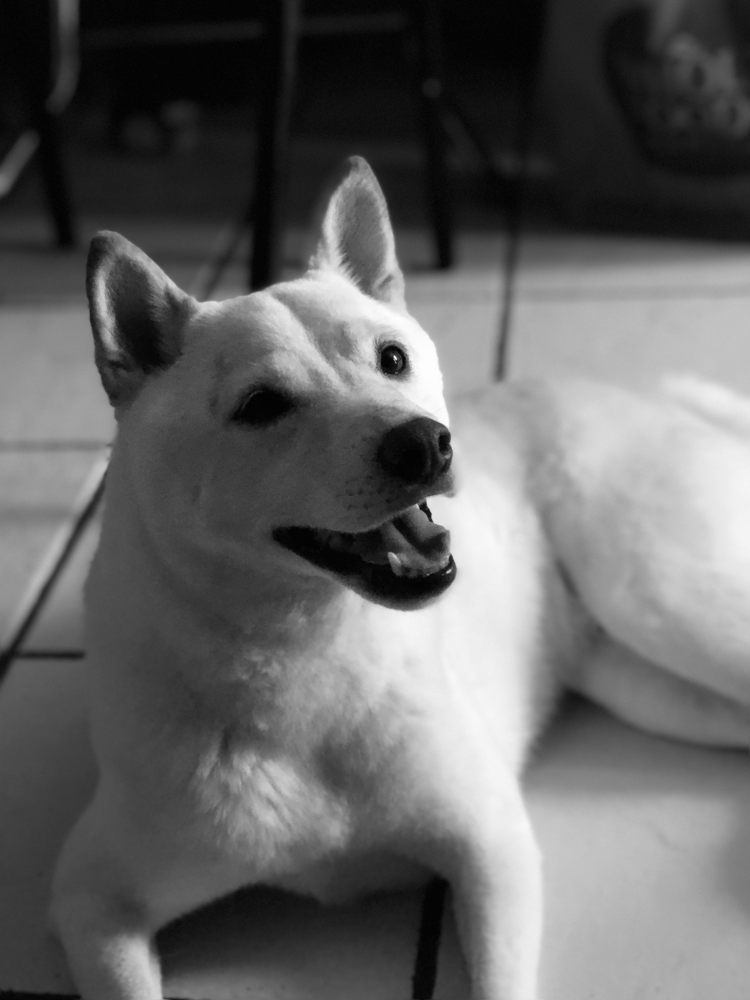

In [ ]:
# show the image
filename = 'dog.jpg'
Image(filename, width=300, height=500)

Let's now read the image into an appropriate matrix and then compute its sigular value decomposition.

In [ ]:
# read the image
A = cv2.imread(filename, cv2.IMREAD_GRAYSCALE)

# compute SVD
U, S, Vh = la.svd(A)

Let's now plot the $k$-truncated SVD with $k \in \{5, 20, 100\}$

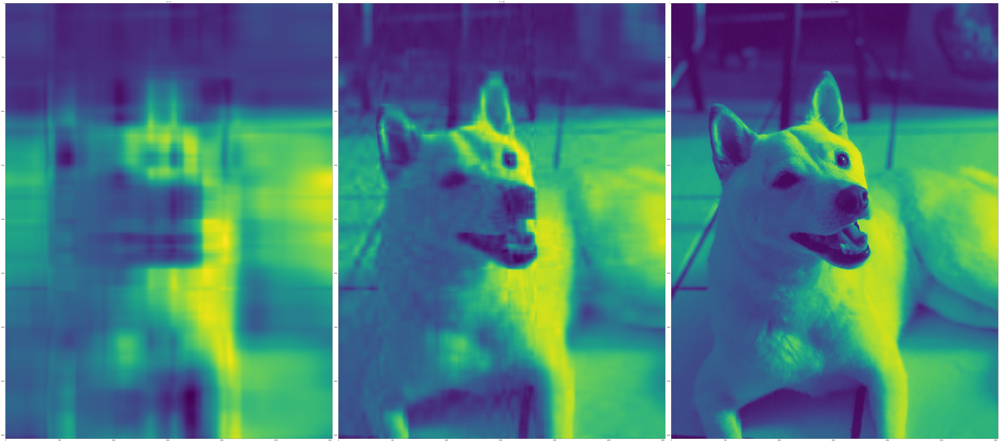

In [ ]:
fig, axs = plt.subplots(1, 3, figsize=(100, 200))
lst = [5, 20, 100]
for j in range(len(lst)):  
  A_k = U[:,:lst[j]] @ np.diag(S[:lst[j]]) @ Vh[:lst[j], :] # k-truncated SVD of A
  axs[j].set_title(f'k = {lst[j]}')
  axs[j].imshow(A_k, interpolation='nearest')
plt.tight_layout()

Interestingly, even the 5-rank approximation seems to be able to capture important features of the image. Even though the contours are not as defined, we can still more or less understand the subject of the image.

To conclude let's determine the smallest $k$ such that $||A-A_{k}||_2\leq0.1⋅||A||_2$.\
From the theory we know that $||A-A_{k}||_2=\sigma_{k+1}$ so we just need to return the smallest $k$ such that $\sigma_{k+1}\leq0.1⋅||A||_2$.

In [ ]:
norm = la.norm(A, 2)
smallest_k = np.min([k for k in range(len(S)-1) if S[k+1] <= 0.1*norm])
print(f'smallest k such that norm(A - A_k) <= 0.1*norm(A): {smallest_k}')

smallest k such that norm(A - A_k) <= 0.1*norm(A): 3


Let's also have a look at the related truncated SVD.

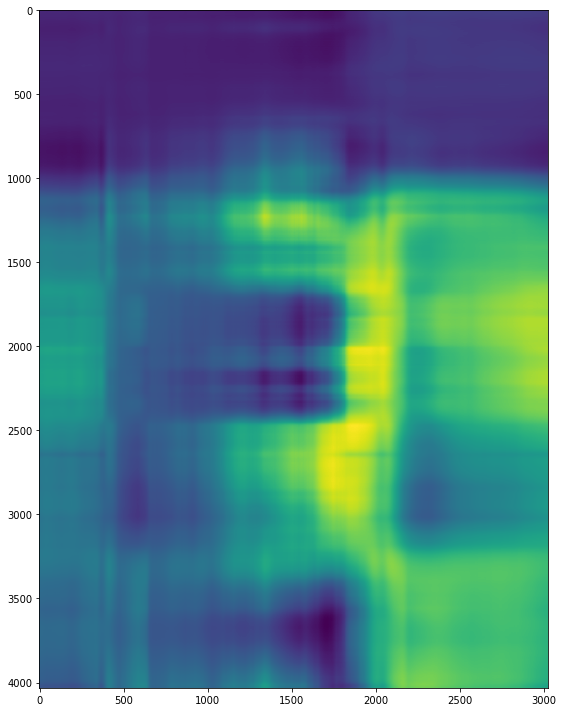

In [ ]:
A_smallest_k = U[:,:smallest_k] @ np.diag(S[:smallest_k]) @ Vh[:smallest_k, :]

fig, ax = plt.subplots(figsize=(10, 10))
ax.imshow(A_smallest_k, interpolation='nearest')
plt.tight_layout()

## Exercise 4

Let's define a custom function $plot\_svd(⋅)$ for which given a $2\times2$ matrix $A$, it plots the right singular vectors in $\mathbb{S}^{1}=\{x\in \mathbb{R}^2: ||x||_2=1\}$ and the left singular vectors in $A\mathbb{S}^{1}$.

In [ ]:
def plot_svd(A):

  # print the matrix
  print(f'A =\n {A}\n')
  # compute SVD decomposition
  U, S, Vh = la.svd(A)
  V = Vh.T

  fig, ax = plt.subplots(1,2)

  # to plot v_1, v_2 we'll use the following variables.
  # we'll use (X, Y) to indicate the origin and (Z, W) to indicate the extreme points of the vectors 
  X = np.zeros(2)
  Y= np.zeros(2)
  Z = V[0,:] # first components of v_1, v_2
  W = V[1,:] # second components of v_1, v_2
  q = ax[0].quiver(X, Y, Z, W, units='xy' ,scale=1)
  circle1 = plt.Circle((0, 0), 1, fill=False)
  ax[0].add_patch(circle1)
  ax[0].set_aspect('equal')

  #########################


  # to plot sigma_1*u_1, sigma_2*u_2 we'll use the following variables.
  # we'll use (X, Y) to indicate the origin and (Z, W) to indicate the extreme points of the vectors 
  X = np.zeros(2)
  Y= np.zeros(2)
  Z = [np.dot(A, V)[0,:]] # first components of sigma_1*u_1, sigma_2*u_2
  W = [np.dot(A, V)[1,:]] # second components of sigma_1*u_1, sigma_2*u_2
  q = ax[1].quiver(X, Y, Z, W, units='xy' ,scale=1)
  ax[1].set_aspect('equal')

  # we now want to plot the ellipse defined by the left singular vectors.
  # Let's then take the angle between the ellipse largest axis u_1 and the x-axis,
  # we'll use such angle to rotate the ellipse of equation X^2/sigma_1^2 + Y^2/sigma_2^2 = 1
  if U[0,0]>=0:
    theta = -np.arccos(np.dot(U[:,0], np.array([1, 0]))) # if u_1 resides in the first/fourth quadrant to get the angle we project onto (1,0)
  else:
    theta = -np.arccos(np.dot(U[:,0], np.array([-1, 0]))) # if u_1 resided in the second/third quadrant to get the angle we project onto (-1,0)

  # A 'standard' ellipse can be parameterized as (s1*cos(t), s2*sin(t)) with s1 >= s2 lengths of the semi-axis
  # Given the angle theta between the major axis and the x-axis, to rotate the ellipse we can just multiply by the rotation matrix:
  # Rot(theta) = [[cos(theta), sin(theta)], [-sin(theta), cos(theta)]]
  # That's exactly how we derived the expressions below for x and y

  t = np.linspace(0, 2 * np.pi, 100)
  x = np.cos(theta)*S[0]*np.cos(t)+np.sin(theta)*S[1]*np.sin(t)
  y = -np.sin(theta)*S[0]*np.cos(t)+np.cos(theta)*S[1]*np.sin(t)
  ax[1].plot(x, y)
  ax[1].set_xlim([-S[0]-0.5, S[0]+0.5])
  ax[1].set_ylim([-S[0]-0.5, S[0]+0.5])

  plt.tight_layout()
  return 

Finally let's apply the function to a randomly generated matrix.

A =
 [[0.01337524 0.72176334]
 [0.64466397 0.46163634]]



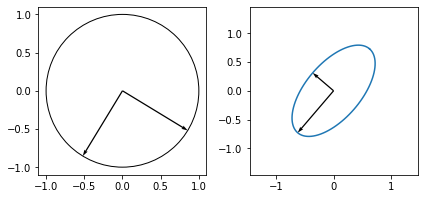

In [ ]:
#np.random.seed(43)
A = np.random.rand(2, 2)
plot_svd(A)

And to conlcude let's also apply the function to the matrix $A$ given in the exercise 5.2

A =
 [[ -2  11]
 [-10   5]]



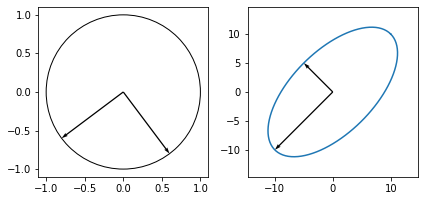

In [ ]:
A = np.array([[-2, 11],[-10,5]])
plot_svd(A)